# Movie Genre Classification

# import libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud
import nltk
import os

# Data collecting

In [4]:
# read the data
train_data = pd.read_csv("C:/Users/Malik/Downloads/Compressed/Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("C:/Users/Malik/Downloads/Compressed/Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')

test_data_solution  = pd.read_csv("C:/Users/Malik/Downloads/Compressed/Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [5]:
# train data 
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [6]:
# train data 
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [7]:
# We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [8]:
df.shape


(108414, 4)

# Data Cleaning and preprocessing`

In [9]:
df.duplicated().sum()

0

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df.isna().any()

id             False
Title          False
Genre          False
Description    False
dtype: bool

In [12]:
df.describe()

,id
count,108414.000000
mean,27104.000452
std,15648.285970
min,1.000000
25%,13552.250000
50%,27104.000000
75%,40655.750000
max,54214.000000


In [13]:
df.dropna(inplace=True)

In [14]:
stopword = set(stopwords.words('english'))

def preprocessing(text):
    text = text.lower()
    
    text = re.sub(r'[^\w\s]', '', text)
    
    text = re.sub(r'[#@\$]', '', text)
    
    tokens = word_tokenize(text)
    
    lemmatizer  = WordNetLemmatizer()
    
    text = text.split()
    
    text = [word for word in text if word not in stopword]
    
    
    return " ".join(text) 
   

In [15]:
df["Despcription_clean"] =  df["Description"].apply(preprocessing)

In [16]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [18]:
df.tail()

,id,Title,Genre,Description,Despcription_clean
54195,54196,"""Tales of Light & Dark"" (2013)",horror,"Covering multiple genres, Tales of Light & Da...",covering multiple genres tales light dark anth...
54196,54197,Der letzte Mohikaner (1965),western,As Alice and Cora Munro attempt to find their...,alice cora munro attempt find father british o...
54197,54198,Oliver Twink (2007),adult,A movie 169 years in the making. Oliver Twist...,movie 169 years making oliver twist artful dod...
54198,54199,Slipstream (1973),drama,"Popular, but mysterious rock D.J Mike Mallard...",popular mysterious rock dj mike mallard askew ...
54199,54200,Curitiba Zero Grau (2010),drama,"Curitiba is a city in movement, with rhythms ...",curitiba city movement rhythms different pulsa...


# Visualize the Data

In [19]:
df["Genre"].value_counts()


 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: Genre, dtype: int64

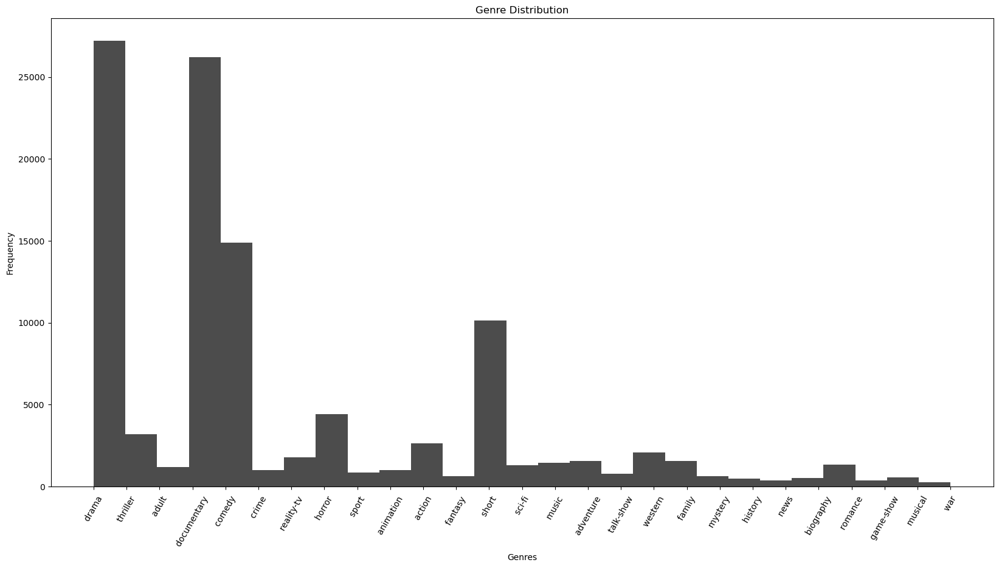

In [20]:
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='black', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=60)
plt.show()

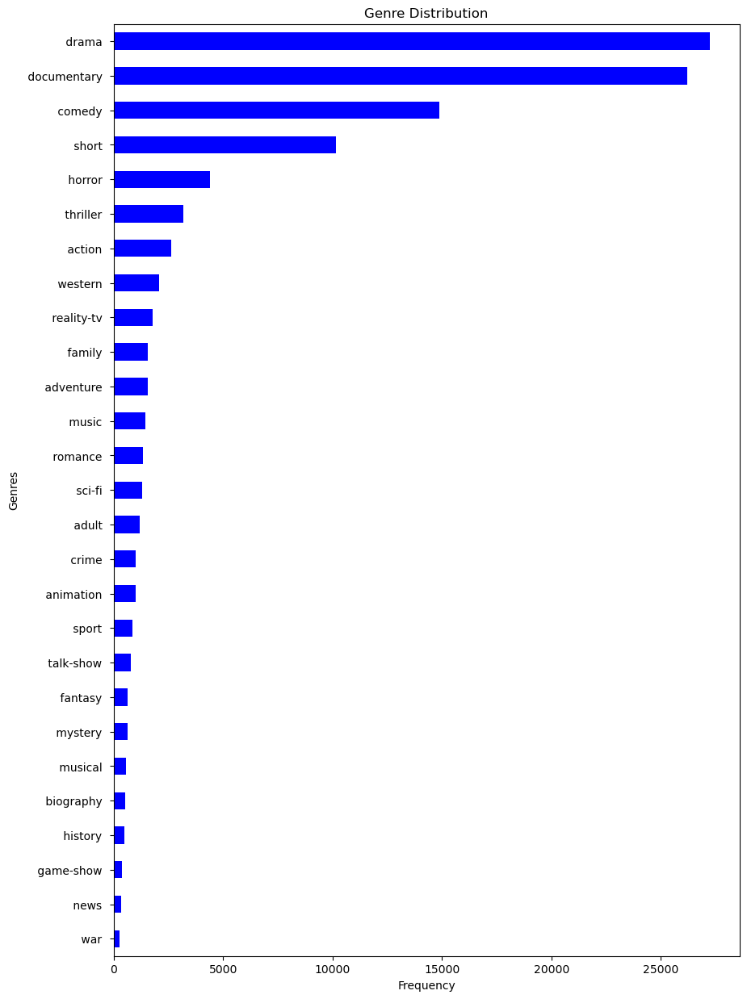

In [21]:

genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

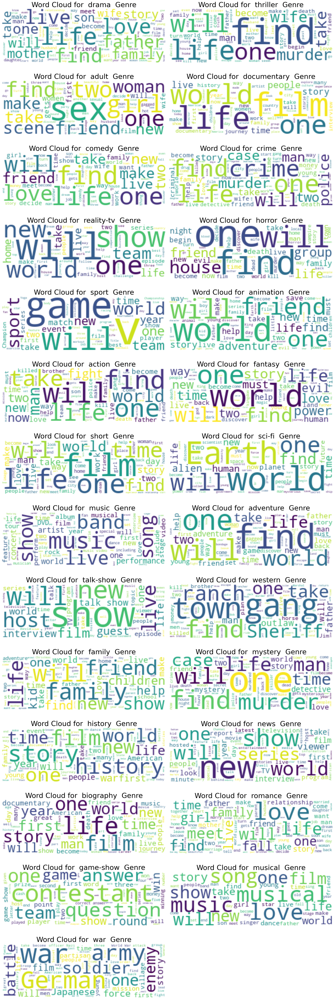

In [22]:
genres = df['Genre'].unique()


plt.figure(figsize=(20, 60))


for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')

    
plt.tight_layout()
plt.show()

In [23]:
data = df.drop(["Title","id"] , axis = 1) # will drop column 
data.head()


,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [24]:
data.tail()

,Genre,Description,Despcription_clean
54195,horror,"Covering multiple genres, Tales of Light & Da...",covering multiple genres tales light dark anth...
54196,western,As Alice and Cora Munro attempt to find their...,alice cora munro attempt find father british o...
54197,adult,A movie 169 years in the making. Oliver Twist...,movie 169 years making oliver twist artful dod...
54198,drama,"Popular, but mysterious rock D.J Mike Mallard...",popular mysterious rock dj mike mallard askew ...
54199,drama,"Curitiba is a city in movement, with rhythms ...",curitiba city movement rhythms different pulsa...


In [25]:
data.count()

Genre                 108414
Description           108414
Despcription_clean    108414
dtype: int64

# Model Selection

In [31]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier 

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay



In [39]:

label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names  

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [40]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [41]:
data.tail()

,Genre,Description,Despcription_clean,Genre_encoded
54195,horror,"Covering multiple genres, Tales of Light & Da...",covering multiple genres tales light dark anth...,13
54196,western,As Alice and Cora Munro attempt to find their...,alice cora munro attempt find father british o...,26
54197,adult,A movie 169 years in the making. Oliver Twist...,movie 169 years making oliver twist artful dod...,1
54198,drama,"Popular, but mysterious rock D.J Mike Mallard...",popular mysterious rock dj mike mallard askew ...,8
54199,drama,"Curitiba is a city in movement, with rhythms ...",curitiba city movement rhythms different pulsa...,8


In [42]:
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

# Use TF-IDF 

In [43]:
from sklearn.feature_extraction.text import TfidfVectorizer


vectorizer = TfidfVectorizer()
x_train1 = vectorizer.fit_transform(x_train)
x_test1 =  vectorizer.transform(x_test)

# Naive-Byes

Model Score on Training data 0.4677255704982751
Model Score on Testing data 0.44451823565222204


D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


               precision    recall  f1-score   support

      action        0.00      0.00      0.00         0
       adult        0.00      0.00      0.00         0
   adventure        0.00      0.00      0.00         0
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.03      0.69      0.07       379
       crime        0.00      0.00      0.00         0
 documentary        0.91      0.52      0.66     22506
       drama        0.88      0.39      0.54     31309
      family        0.00      0.00      0.00         0
     fantasy        0.00      0.00      0.00         0
   game-show        0.00      0.00      0.00         0
     history        0.00      0.00      0.00         0
      horror        0.00      0.00      0.00         0
       music        0.00      0.00      0.00         0
     musical        0.00      0.00      0.00         0
     mystery        0.00      0.00      0.00         0
        n

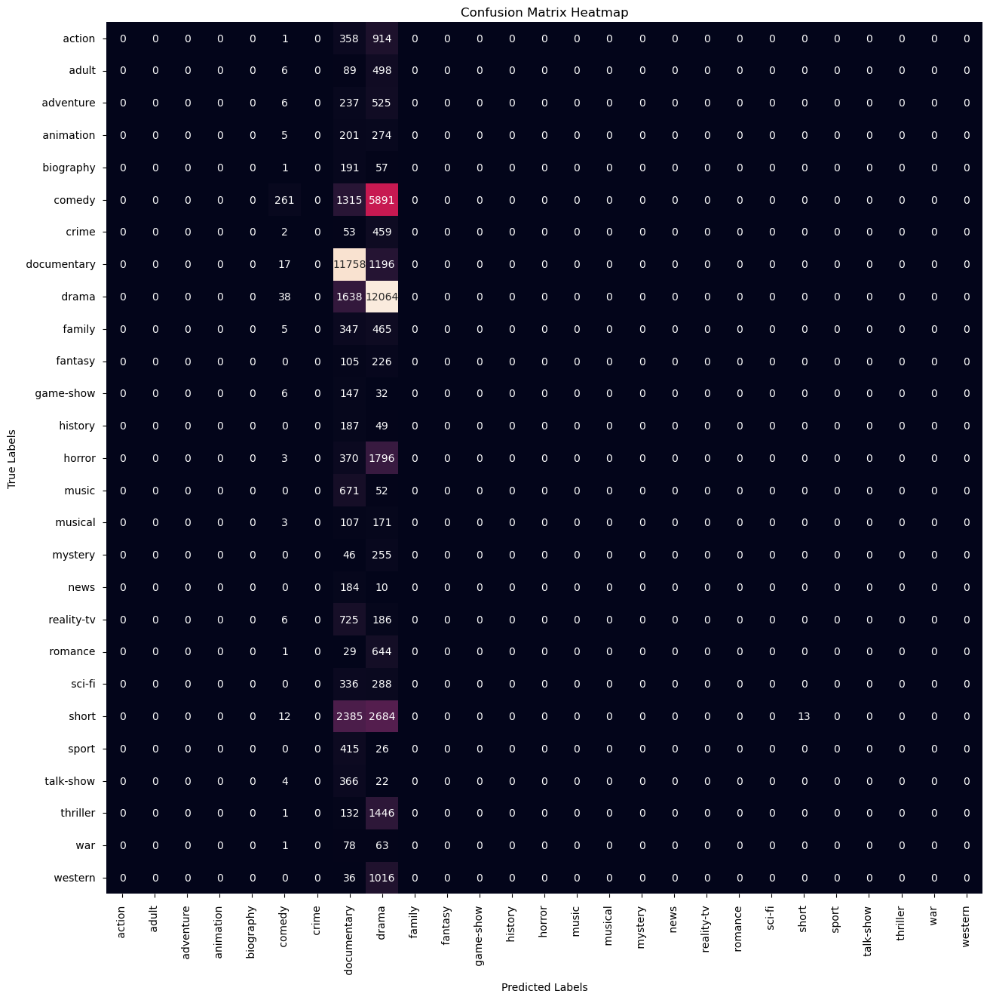

In [44]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Testing data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15)) 
sns.heatmap(cm, annot=True, fmt='d', cbar=False,xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

# Logistic Regression

D:\anaconda 3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Model Score on Training data 0.7064032320549006
Model Score on testing data 0.5872119836921431


D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda 3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


               precision    recall  f1-score   support

      action        0.25      0.52      0.34       616
       adult        0.22      0.73      0.34       179
   adventure        0.16      0.66      0.26       190
   animation        0.05      0.79      0.09        29
   biography        0.00      0.00      0.00         0
      comedy        0.60      0.54      0.57      8255
       crime        0.02      0.22      0.03        36
 documentary        0.89      0.64      0.74     17966
       drama        0.79      0.54      0.64     19937
      family        0.09      0.56      0.15       124
     fantasy        0.01      0.29      0.01         7
   game-show        0.51      0.82      0.63       114
     history        0.00      0.00      0.00         0
      horror        0.56      0.68      0.61      1785
       music        0.36      0.75      0.49       348
     musical        0.00      0.00      0.00         1
     mystery        0.00      0.00      0.00         0
        n

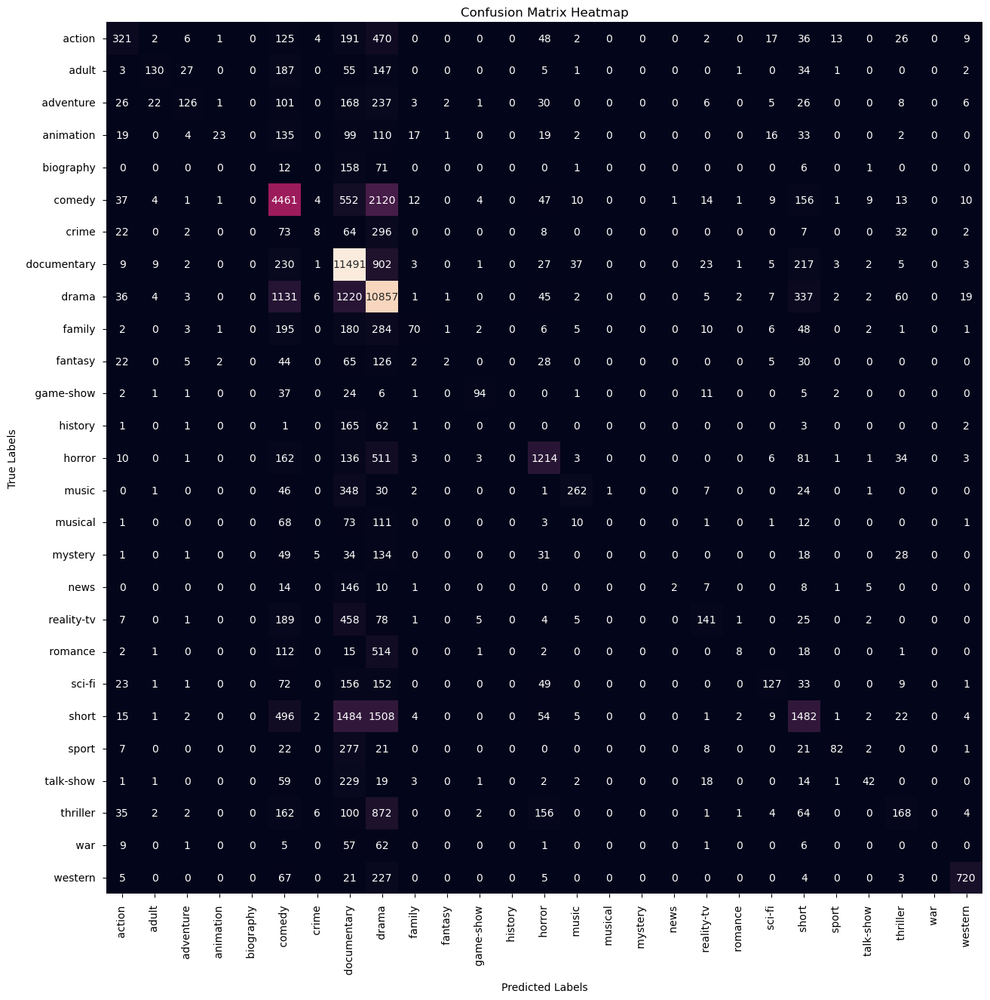

In [45]:
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on testing data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15)) 
sns.heatmap(cm, annot=True, fmt='d', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

# Support Vector Machine

D:\anaconda 3\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


Model Score on Training data 0.9799841348903278
Model Score on testing data 0.5913073957237995
               precision    recall  f1-score   support

      action        0.35      0.42      0.38      1042
       adult        0.42      0.67      0.52       370
   adventure        0.22      0.53      0.31       321
   animation        0.14      0.43      0.21       157
   biography        0.00      0.09      0.01        11
      comedy        0.60      0.55      0.57      8097
       crime        0.05      0.29      0.09        93
 documentary        0.84      0.69      0.76     15731
       drama        0.72      0.57      0.64     17484
      family        0.17      0.48      0.25       281
     fantasy        0.07      0.33      0.11        69
   game-show        0.68      0.74      0.71       171
     history        0.02      0.31      0.03        13
      horror        0.66      0.62      0.64      2318
       music        0.55      0.66      0.60       603
     musical        0.06

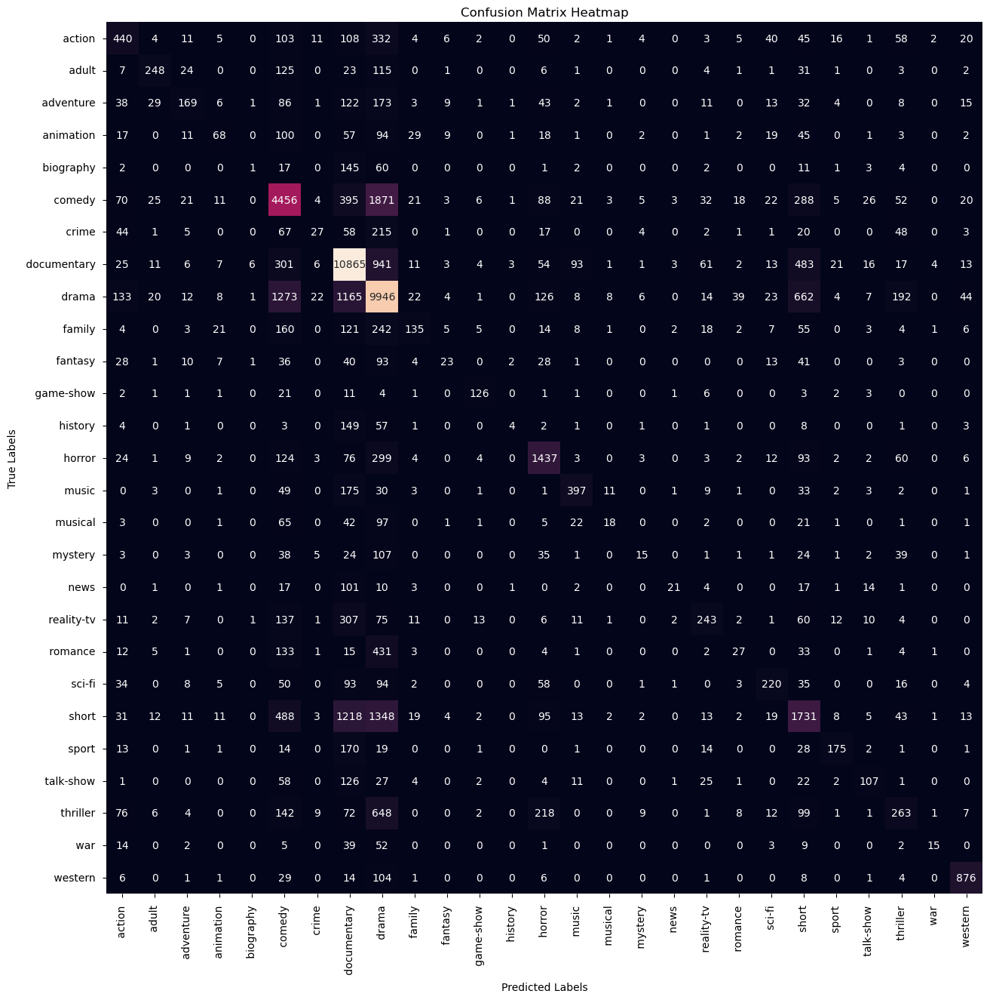

In [46]:
svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on testing data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))




cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15)) 
sns.heatmap(cm, annot=True, fmt='d', cbar=False,xticklabels=class_names, yticklabels=class_names) 
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()